# Rofos Hardcoded Environment

## Libraries - Setup

In [ ]:
import gym
try :
  # In Google Colab
  %tensorflow_version 2.x
except :
  pass

# Import Tensorflow
import tensorflow as tf

# Assure TensorFlow version >= 2 is installed. Otherwise install TensorFlow 2.0 version.
try :
  assert tf.__version__ >= "2.0"
  print ("TensorFlow version found:", tf.__version__)
except :
  !pip install tensorflow==2.4

# Import NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow
import pickle
from matplotlib import style
import time
from PIL import Image

style.use("ggplot")
# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# To get smooth animations
import matplotlib.animation as animation
mpl.rc('animation', html='jshtml')

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
TensorFlow version found: 2.12.0


In [ ]:
import base64

from IPython.display import HTML
from IPython import display as ipythondisplay

try:
  from pyvirtualdisplay import Display
  display = Display(visible=0, size=(1400, 900))
  display.start()
except ImportError:
    pass

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Plots and Animations Functions

In [ ]:
# Creates an image for the environment
def plot_environment(env, figsize = (5,4)):
    plt.figure( figsize = figsize)
    img = env.render(mode = "rgb_array")
    plt.imshow(img)
    plt.axis("off")
    return img

In [ ]:
#Stores all the images to create an animation

def update_scene(num, frames, patch):
    patch.set_data(frames[num])
    return patch,

def plot_animation(frames, repeat=False, interval=40):
    fig = plt.figure()
    patch = plt.imshow(frames[0])
    plt.axis('off')
    anim = animation.FuncAnimation(
        fig, update_scene, fargs=(frames, patch),
        frames=len(frames), repeat=repeat, interval=interval)
    plt.close()
    return anim

## Create Environment

First we define our variables for our enviroment and for our Q-learning

In [ ]:
SIZE = 30
HM_EPISODES = 300000
MOVE_PENALTY = 1
# HIT_PENALTY = 300
BOUNDARY_PENALTY = 10
GOAL_REWARD = 1000
episode_rewards = []
FRAMES = []
epsilon =0.9
EPS_DECAY = 0.9998

SHOW_EVERY = 30000
SHOW_FRAMES = 30000
SHOW_QTABLE = 200

start_q_table = None # or filename so we would take an already q table

LEARNING_RATE = 0.1
DISCOUNT = 0.95

PLAYER_N = 1
GOAL_N = 2
OTHER_N = 3

d = {1: (255,175,0), 2: (0,255,0),3: (0,0,255)}

In [ ]:
def wind_direction_sensor(x,y):
  directions = np.ones((20,20))
  directions = 8*directions #to come from north
  angles = {0:90,1:77.5,2:45,3:22.5,4:0,5:337.5,6:315,7:292.5,8:270,9:247.5,10:225,11:202.5,12:180,13:157.5,14:135,15:112.5}

  return angles[directions[x,y]]

Now we will create our boat class for the example with the idea that the wind comes from the north and is steady everywhere


In [ ]:
class Boat:
  def __init__(self):
    # self.x = np.random.randint(0,SIZE)
    # self.y = np.random.randint(0,SIZE)
      self.x = 15
      self.y = 10
      self.rudder = 270
      self.sail = 270

  def __str__(self):
    return f"{self.x}, {self.y}"

  def __sub__(self, other):
    return (self.x - other.x,self.y - other.y)

  def action(self, rudder_angle, sail_angle):
    # wind_dir  = wind_direction_sensor(self.x,self.y)

############################################
##### the angle of the rudder is 0 degrees
############################################

    if rudder_angle == 0: #angle 0
      if sail_angle == 0: #angle 0
        self.move(x = 0 , y = -3)
      elif sail_angle == 1: #angle -30 (330)
        self.move(x = 0, y = -2)
      elif sail_angle == 2: #angle -60 (300)
        self.move(x = 0 , y = -1)
      elif sail_angle == 3: #angle -90 (270)
        self.move(x = 0, y = 0)
      elif sail_angle == 4: #angle -120 (240)
        self.move(x = 0 , y = -1)
      elif sail_angle == 5: #angle -150 (210)
        self.move(x = 0, y = -2)
      elif sail_angle == 6: #angle 180
        self.move(x = 0 , y = -3)

############################################
##### the angle of the rudder is 45 degrees
############################################

    elif rudder_angle == 1: #angle 45
      if sail_angle == 0: #angle 0
        self.move(x = -2 , y = -2)
      elif sail_angle == 1: #angle -30 (330)
        self.move(x = -1, y = -1)
      elif sail_angle == 2: #angle -60 (300)
        self.move(x = 1 , y = 1)
      elif sail_angle == 3: #angle -90 (270)
        self.move(x = 1, y = 1)
      elif sail_angle == 4: #angle -120 (240)
        self.move(x = 2 , y = 2)
      elif sail_angle == 5: #angle -150 (210)
        self.move(x = -2, y = -2)
      elif sail_angle == 6: #angle 180
        self.move(x = -2 , y = -2)

############################################
##### the angle of the rudder is -45 degrees
############################################
    elif rudder_angle == 2: #angle 45
      if sail_angle == 0: #angle 0
        self.move(x = -2 , y = -2)
      elif sail_angle == 1: #angle -30 (330)
        self.move(x = -2, y = -2)
      elif sail_angle == 2: #angle -60 (300)
        self.move(x = 2 , y = 2)
      elif sail_angle == 3: #angle -90 (270)
        self.move(x = 1, y = 1)
      elif sail_angle == 4: #angle -120 (240)
        self.move(x = 1 , y = 1)
      elif sail_angle == 5: #angle -150 (210)
        self.move(x = -1, y = -1)
      elif sail_angle == 6: #angle 180
        self.move(x = -2 , y = -2)

  def move(self,x=False,y=False):
    if not x:
      self.x += np.random.randint(-1,2)
    else:
      self.x += x
    if not y:
      self.y += np.random.randint(-1,2)
    else:
      self.y += y

    if self.x < 0:
      self.x = 0
    elif self.x > SIZE-1:
      self.x = SIZE-1

    if self.y < 0:
      self.y = 0
    elif self.y > SIZE-1:
      self.y = SIZE-1

if start_q_table is None:
  q_table = {}
  for x1 in range(-SIZE+1,SIZE):
      for y1 in range(-SIZE+1,SIZE):
                q_table[(x1,y1)] = [[np.random.uniform(-4,0) for i in range(3)],[np.random.uniform(-8,0) for i in range(7)]]
else:
  with open(start_qtable, "rb") as f:
    q_table = pickle.load(f)

## Q-Table Initialization and Q-Learning

In [ ]:
for episode in range(HM_EPISODES):
  player = Boat()
  GOAL = Boat()
  GOAL.y = 25

  if episode % SHOW_EVERY == 0:
    print(f"on # {episode}, epsilon:{epsilon}")
    print(f"{SHOW_EVERY} ep mean {np.mean(episode_rewards[-SHOW_EVERY:])}")
    show = True
  else:
    show = False

  episode_reward = 0
  for i in range(200):
    obs = (player-GOAL)
    if np.random.random() > epsilon:
      actions = [np.argmax(q_table[obs][0]),np.argmax(q_table[obs][1])]

    else:
      actions = [np.random.randint(0,3),np.random.randint(0,7)]
    player.action(actions[0],actions[1])

    if player.x == 30 or player.y == 30:
      reward = -BOUNDARY_PENALTY

    elif player.x == GOAL.x and player.y == GOAL.y:
      reward = GOAL_REWARD
    else:
      reward = -MOVE_PENALTY
###quicksave
    new_obs = (player - GOAL)
    max_future_q0 = np.max(q_table[new_obs][0][actions[0]])
    max_future_q1 = np.max(q_table[new_obs][1][actions[1]])

    current_q0 = q_table[obs][0][actions[0]]
    current_q1 = q_table[obs][1][actions[1]]

    if reward == GOAL_REWARD:
      new_q = GOAL_REWARD
    if reward == BOUNDARY_PENALTY:
      new_q = -BOUNDARY_PENALTY
    else:
      new_q0 = (1-LEARNING_RATE)*current_q0 + LEARNING_RATE * (reward + DISCOUNT*max_future_q0)
      new_q1 = (1-LEARNING_RATE)*current_q1 + LEARNING_RATE * (reward + DISCOUNT*max_future_q1)

    q_table[obs][0][actions[0]] = new_q0
    q_table[obs][1][actions[1]] = new_q1

    if episode % SHOW_FRAMES == 0:
      env = np.zeros((SIZE,SIZE, 3),dtype = np.uint8)
      env[GOAL.y][GOAL.x] = d[GOAL_N]
      env[player.y][player.x] = d[PLAYER_N]

      img = Image.fromarray(env, "RGB")
      img = img.resize((300,300))

      FRAMES.append(img)
      if reward == GOAL_REWARD or reward == -BOUNDARY_PENALTY:
        break

    episode_reward += reward
    if reward == GOAL_REWARD or reward == -BOUNDARY_PENALTY:
      break

    epsilon *= EPS_DECAY
    episode_rewards.append(episode_reward)



on # 0, epsilon:0.9
30000 ep mean nan


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


on # 30000, epsilon:1.235e-320
30000 ep mean -83.6411
on # 60000, epsilon:1.235e-320
30000 ep mean -83.46153333333334
on # 90000, epsilon:1.235e-320
30000 ep mean -85.75103333333334
on # 120000, epsilon:1.235e-320
30000 ep mean -86.14823333333334
on # 150000, epsilon:1.235e-320
30000 ep mean -83.12413333333333
on # 180000, epsilon:1.235e-320
30000 ep mean -84.62293333333334
on # 210000, epsilon:1.235e-320
30000 ep mean -82.90023333333333
on # 240000, epsilon:1.235e-320
30000 ep mean -84.70586666666667
on # 270000, epsilon:1.235e-320
30000 ep mean -85.42303333333334


In [ ]:
with open(f"qtable-{int(time.time())}.pickle", "wb") as f:
    pickle.dump(q_table, f)

## Plots and Results

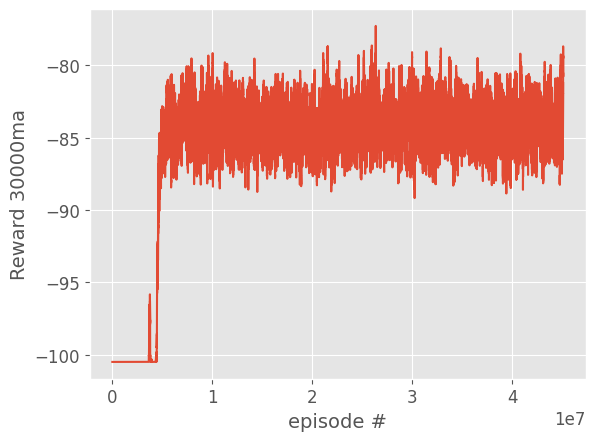

In [ ]:
moving_avg = np.convolve(episode_rewards, np.ones((SHOW_EVERY,))/SHOW_EVERY, mode='valid')

plt.plot([i for i in range(len(moving_avg))], moving_avg)
plt.ylabel(f"Reward {SHOW_EVERY}ma")
plt.xlabel("episode #")
plt.show()

In [ ]:
len(FRAMES)

1431

In [ ]:
import matplotlib
plot_animation(FRAMES)